<a href="https://colab.research.google.com/github/archie46/Computer-Vision-Labarotary/blob/main/CV3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans

In [ ]:
!wget -O dog.jpg "https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg"

--2023-09-07 14:27:28--  https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg
Resolving cdn.britannica.com (cdn.britannica.com)... 52.84.18.73, 52.84.18.97, 52.84.18.123, ...
Connecting to cdn.britannica.com (cdn.britannica.com)|52.84.18.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 344524 (336K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 336.45K  --.-KB/s    in 0.04s   

2023-09-07 14:27:28 (8.29 MB/s) - ‘dog.jpg’ saved [344524/344524]



In [ ]:
img = cv2.imread("dog.jpg")
#original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

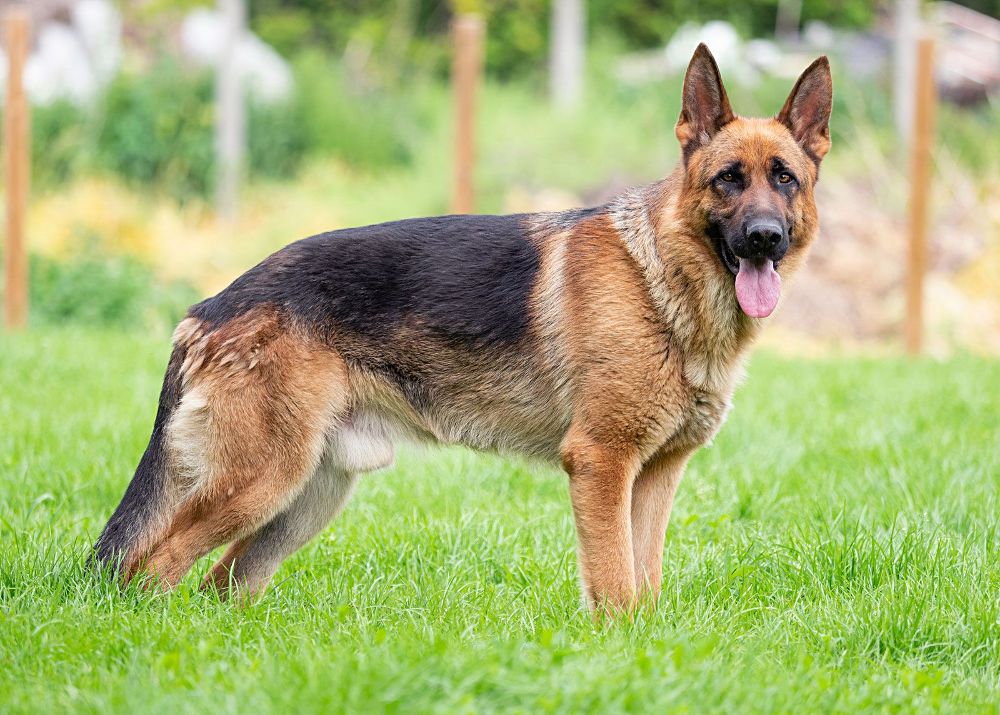

In [ ]:
cv2_imshow(img)

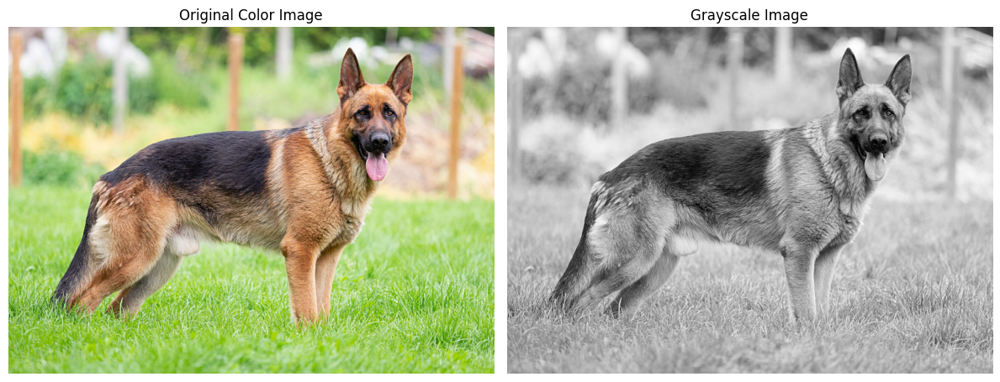

In [ ]:
# Convert the color image to grayscale
gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Display the original color image and the grayscale version side by side
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Color Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.tight_layout()
plt.show()

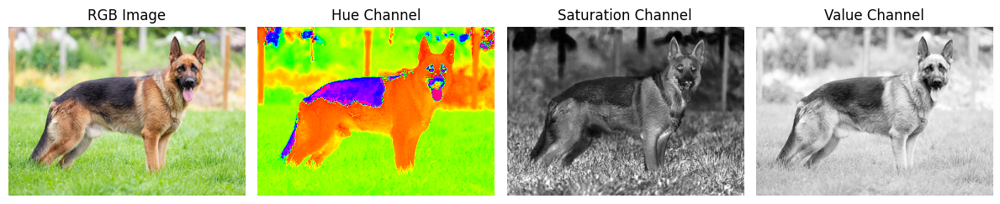

In [ ]:
# Convert the RGB image to HSV
image_hsv = cv2.cvtColor(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.COLOR_RGB2HSV)

# Split the HSV image into its components (Hue, Saturation, Value)
hue_channel = image_hsv[:, :, 0]
saturation_channel = image_hsv[:, :, 1]
value_channel = image_hsv[:, :, 2]

# Visualize the original RGB image and its HSV components
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('RGB Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(hue_channel, cmap='hsv', vmin=0, vmax=179)  # Hue values range from 0 to 179
plt.title('Hue Channel')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(saturation_channel, cmap='gray', vmin=0, vmax=255)  # Saturation values range from 0 to 255
plt.title('Saturation Channel')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(value_channel, cmap='gray', vmin=0, vmax=255)  # Value (brightness) values range from 0 to 255
plt.title('Value Channel')
plt.axis('off')

plt.tight_layout()
plt.show()

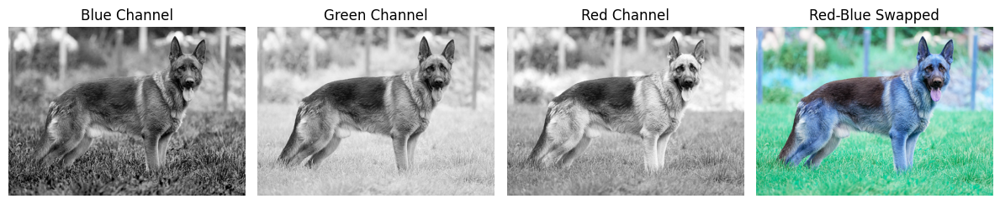

In [ ]:
# Split the image into its individual color channels
blue_channel = img[:, :, 0]
green_channel = img[:, :, 1]
red_channel = img[:, :, 2]

# Display the individual color channels as grayscale images
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(blue_channel, cv2.COLOR_BGR2RGB), cmap='gray')
plt.title('Blue Channel')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(cv2.cvtColor(green_channel, cv2.COLOR_BGR2RGB), cmap='gray')
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(cv2.cvtColor(red_channel, cv2.COLOR_BGR2RGB), cmap='gray')
plt.title('Red Channel')
plt.axis('off')

# Swap the red and blue channels to create an artistic effect
swapped_image = img.copy()
swapped_image[:, :, 0] = red_channel  # Replace the blue channel with the red channel
swapped_image[:, :, 2] = blue_channel  # Replace the red channel with the blue channel

plt.subplot(1, 4, 4)
plt.imshow(cv2.cvtColor(swapped_image, cv2.COLOR_BGR2RGB))
plt.title('Red-Blue Swapped')
plt.axis('off')

plt.tight_layout()
plt.show()

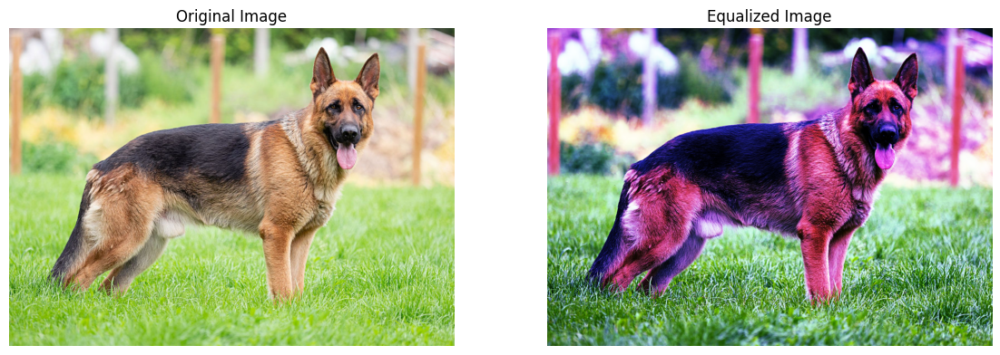

In [ ]:
# Split the image into its individual color channels
blue_channel = img[:, :, 0]
green_channel = img[:, :, 1]
red_channel = img[:, :, 2]

# Apply histogram equalization to one or more channels
equalized_blue = cv2.equalizeHist(blue_channel)
equalized_green = cv2.equalizeHist(green_channel)
equalized_red = cv2.equalizeHist(red_channel)

# Merge the equalized channels to create the equalized image
equalized_image = cv2.merge((equalized_blue, equalized_green, equalized_red))

# Convert from BGR to RGB (if necessary)
equalized_image_rgb = cv2.cvtColor(equalized_image, cv2.COLOR_BGR2RGB)

# Display the original and equalized images for comparison
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image_rgb)
plt.title('Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()

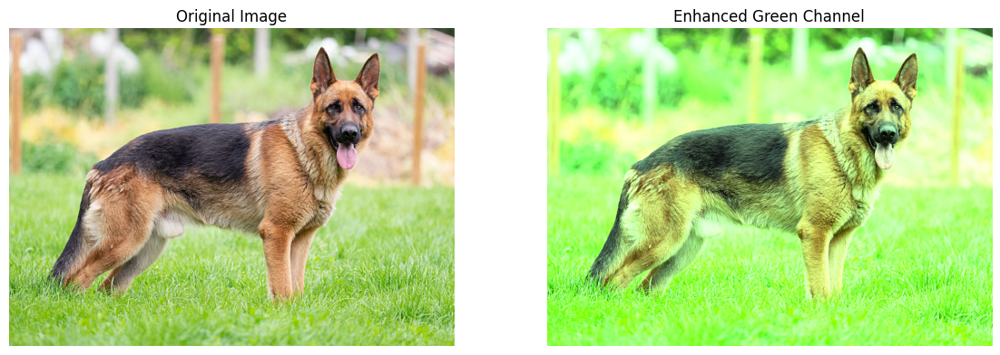

In [ ]:
# Split the image into its individual color channels
blue_channel = img[:, :, 0]
green_channel = img[:, :, 1]
red_channel = img[:, :, 2]

# Define the color enhancement factor (adjust this as needed)
enhancement_factor = 1.5  # You can experiment with different values

# Enhance the green channel (increase its intensity)
enhanced_green_channel = np.multiply(green_channel , enhancement_factor)

# Clip values to ensure they stay within the valid range (0-255)
enhanced_green_channel = np.clip(enhanced_green_channel, 0, 255).astype(np.uint8)

# Create a new image with the enhanced green channel and the original blue and red channels
enhanced_image = cv2.merge((blue_channel, enhanced_green_channel, red_channel))

# Convert from BGR to RGB (if necessary)
enhanced_image_rgb = cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB)

# Display the original and enhanced images
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_image_rgb)
plt.title('Enhanced Green Channel')
plt.axis('off')

plt.tight_layout()
plt.show()

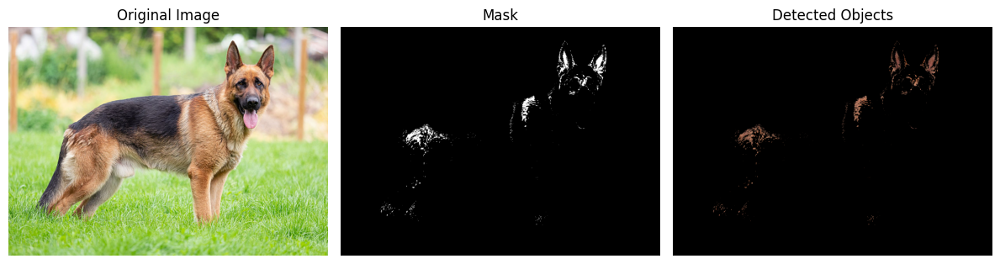

In [ ]:
# Convert the image from BGR to HSV color space
image_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define the lower and upper HSV thresholds for the color you want to detect (red in this example)
# You may need to adjust these values based on your specific image and lighting conditions
lower_red = np.array([0, 100, 100])  # Lower HSV range for red
upper_red = np.array([10, 255, 255])  # Upper HSV range for red

# Create a mask by thresholding the image based on the defined color range
mask = cv2.inRange(image_hsv, lower_red, upper_red)

# Apply the mask to the original image to extract the detected objects
result = cv2.bitwise_and(img, img, mask=mask)

# Display the original image, mask, and the detected objects using Matplotlib
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Detected Objects')
plt.axis('off')

plt.tight_layout()
plt.show()

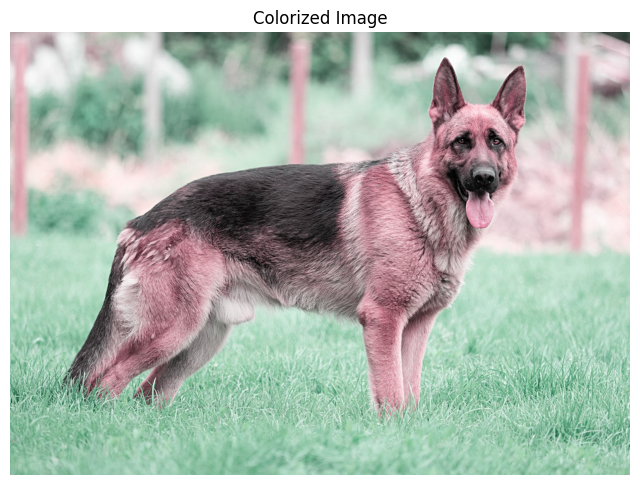

In [ ]:
# Ensure that the gray_image image and color image have the same dimensions
color_image = cv2.resize(img, (gray_image.shape[1], gray_image.shape[0]))

# Create a colorized image by merging the color channels from the color image with the gray_image image
colorized_image = cv2.merge([gray_image, img[:, :, 1], img[:, :, 2]])

# Convert BGR to RGB for Matplotlib display
colorized_image_rgb = cv2.cvtColor(colorized_image, cv2.COLOR_BGR2RGB)

# Display the colorized image using Matplotlib
plt.figure(figsize=(8, 8))
plt.imshow(colorized_image_rgb)
plt.axis('off')
plt.title('Colorized Image')
plt.show()

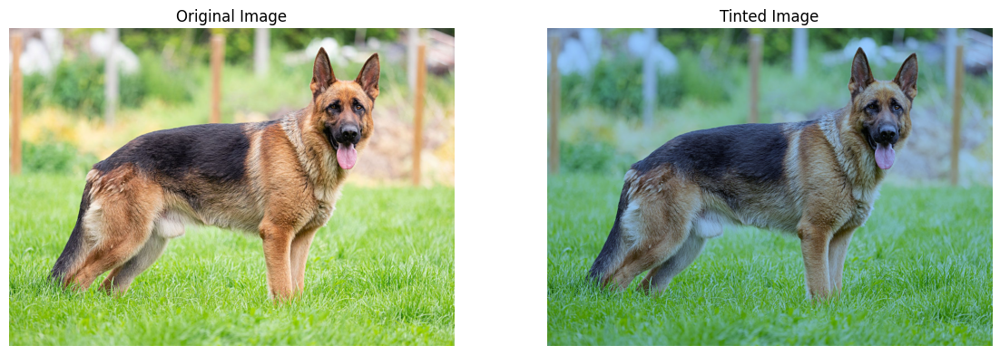

In [ ]:
# Split the image into its individual color channels
blue_channel = img[:, :, 0]
green_channel = img[:, :, 1]
red_channel = img[:, :, 2]

# Define color tints as scaling factors for each channel (1.0 means no change)
blue_tint = 1.0  # Adjust this value for a blue tint
green_tint = 0.8  # Adjust this value for a green tint
red_tint = 0.6  # Adjust this value for a red tint

# Apply the color tints by scaling the individual color channels
blue_tinted_channel = np.multiply(blue_channel , blue_tint)
green_tinted_channel = np.multiply(green_channel , green_tint)
red_tinted_channel = np.multiply(red_channel , red_tint)

# Combine the tinted channels to create the tinted image
tinted_image = cv2.merge((blue_tinted_channel, green_tinted_channel, red_tinted_channel))

# Clip values to ensure they stay within the valid range (0-255)
tinted_image = np.clip(tinted_image, 0, 255).astype(np.uint8)

# Convert from BGR to RGB for Matplotlib display
tinted_image_rgb = cv2.cvtColor(tinted_image, cv2.COLOR_BGR2RGB)

# Display the original and tinted images
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(tinted_image_rgb)
plt.title('Tinted Image')
plt.axis('off')

plt.tight_layout()
plt.show()

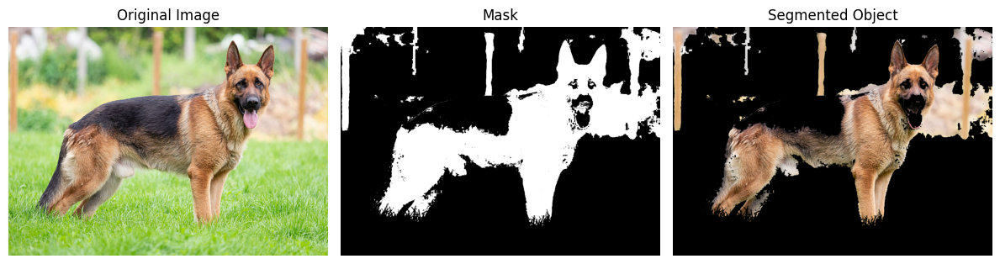

In [ ]:
# Convert the image to the LAB color space
lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

# Define the lower and upper bounds of the LAB color range for the object you want to segment
# You may need to adjust these values based on your specific image and color range
lower_bound = np.array([0, 128, 128])  # Lower LAB range for the object
upper_bound = np.array([255, 255, 255])  # Upper LAB range for the object

# Create a mask by thresholding the LAB image based on the defined color range
mask = cv2.inRange(lab_image, lower_bound, upper_bound)

# Apply the mask to the original image to extract the segmented object
segmented_image = cv2.bitwise_and(img, img, mask=mask)

# Convert BGR to RGB for Matplotlib display
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
segmented_image_rgb = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB)

# Display the original image, mask, and segmented object using Matplotlib
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(segmented_image_rgb)
plt.title('Segmented Object')
plt.axis('off')

plt.tight_layout()
plt.show()

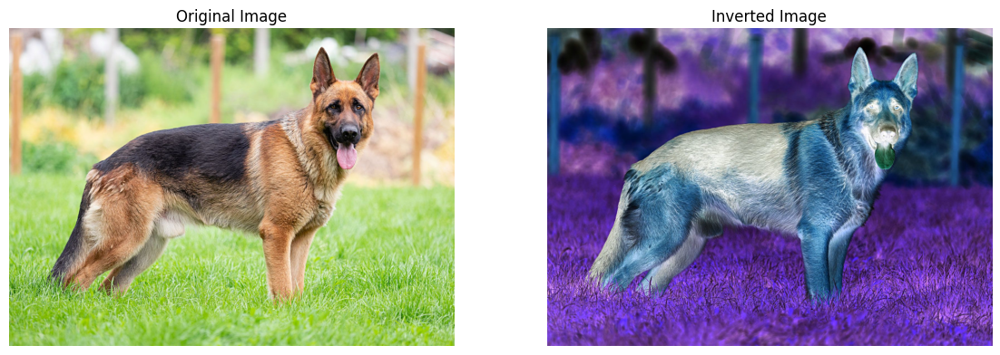

In [ ]:
inverted_image = np.subtract(255,img)

# Convert BGR to RGB for Matplotlib display
inverted_image_rgb = cv2.cvtColor(inverted_image, cv2.COLOR_BGR2RGB)

# Display the original and inverted images
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(inverted_image_rgb)
plt.title('Inverted Image')
plt.axis('off')

plt.tight_layout()
plt.show()

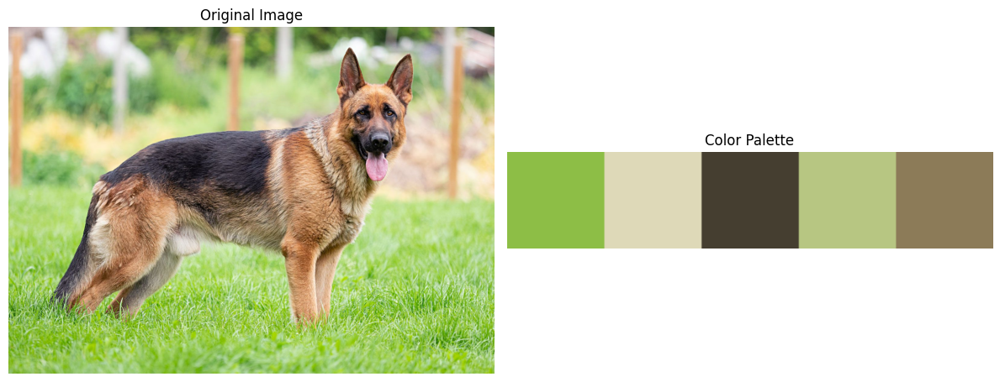

In [ ]:
# Convert BGR to RGB
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Flatten the image to create a list of pixels
pixels = image_rgb.reshape(-1, 3)

# Determine the number of dominant colors to extract
num_colors = 5  # Adjust this number based on your preference

# Perform K-Means clustering to find the dominant colors
kmeans = KMeans(n_clusters=num_colors, n_init='auto')
kmeans.fit(pixels)

# Get the RGB values of the cluster centers (dominant colors)
dominant_colors = kmeans.cluster_centers_.astype(int)

# Create a color palette image with the dominant colors
palette = np.zeros((50, 50 * num_colors, 3), dtype=np.uint8)

for i, color in enumerate(dominant_colors):
    palette[:, i * 50:(i + 1) * 50] = color

# Display the original image and the color palette
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(palette)
plt.title('Color Palette')
plt.axis('off')

plt.tight_layout()
plt.show()